# Выпускная квалификационная работа - 1 Разведочный анализ  данных

1. Провести разведочный анализ предложенных данных
 * нарисовать гистограммы распределения каждой из переменной,
 * диаграммы ящика с усами, попарные графики рассеяния точек.
 * необходимо также для каждой колонке получить среднее, медианное значение, 
 * провести анализ и исключение выбросов,
 * проверить наличие пропусков.     


In [75]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

## Загрузка данных

In [76]:
df_bp = pd.read_excel('data/X_bp_original.xlsx', index_col=0)
df_bp.sample(11)

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
471,3.656437,1923.649471,559.380732,109.219575,22.397008,306.957575,452.025051,72.216524,2596.398221,41.048278
505,5.452959,1918.688919,1016.975202,119.048341,23.461800,275.341538,41.129428,82.237600,2066.553692,278.510337
466,2.408626,1926.563761,637.884690,53.753338,18.399305,275.890335,263.449280,77.662035,1973.734897,304.246115
152,1.493196,1997.212555,1010.784737,107.549456,17.300539,322.532498,165.345449,72.775930,2144.891733,160.115495
915,4.529072,1816.400606,428.924382,138.348410,24.757775,233.724615,530.591317,76.823842,2973.053247,132.550916
296,3.202768,1911.931680,955.175762,77.952151,20.968753,310.726683,330.922384,77.106056,1811.607492,291.531021
760,2.488863,1920.085594,529.887068,126.053973,25.403925,321.184936,335.939917,75.902153,2325.464987,215.511821
412,2.885855,1951.714931,918.042452,198.953207,26.811285,286.748810,962.345527,73.662132,1379.568514,178.357504
584,2.163567,1913.021899,606.244186,129.246402,19.292115,348.597738,493.708023,72.638695,1901.323144,204.324648
220,2.689064,2059.842529,538.736628,137.118584,25.401720,263.387024,1004.066062,68.062377,2643.225518,294.421622


In [77]:
pd.DataFrame(df_bp.columns, columns=['признаки базальтопластик'])

,признаки базальтопластик
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


In [78]:
print('наблюдений: %i, признаков: %i в X_bp' % df_bp.shape)

наблюдений: 1023, признаков: 10 в X_bp


In [79]:
df_nup = pd.read_excel('data/X_nup_original.xlsx', index_col=0)
df_nup

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0,4.000000,57.000000
1,0,4.000000,60.000000
2,0,4.000000,70.000000
3,0,5.000000,47.000000
4,0,5.000000,57.000000
...,...,...,...
1035,90,8.088111,47.759177
1036,90,7.619138,66.931932
1037,90,9.800926,72.858286
1038,90,10.079859,65.519479


In [80]:
pd.DataFrame(df_nup.columns, columns=['признаки нашивок'])

,признаки нашивок
0,"Угол нашивки, град"
1,Шаг нашивки
2,Плотность нашивки


In [81]:
print('строк: %i, признаков: %i в X_nup' % df_nup.shape)

строк: 1040, признаков: 3 в X_nup


In [82]:
df = df_bp.join(df_nup, how='left')
df.sample(8).T

,562,311,660,626,352,610,924,398
Соотношение матрица-наполнитель,3.400636,1.595285,3.824246,2.245217,3.604674,3.311244,1.862875,4.228051
"Плотность, кг/м3",1902.323754,1895.084314,1999.219950,2192.738783,2055.243403,2076.665686,1993.662575,1839.671316
"модуль упругости, ГПа",809.682112,539.966472,1399.795415,611.766338,956.246864,1089.484745,102.490025,316.027473
"Количество отвердителя, м.%",138.490884,151.843877,142.951257,108.265862,48.911476,57.005741,142.797271,155.778081
"Содержание эпоксидных групп,%_2",21.887169,21.630084,20.925758,18.056093,23.470463,18.847271,24.154225,25.369187
"Температура вспышки, С_2",282.363184,311.756871,286.093012,339.313586,295.900591,298.230819,354.890074,359.642483
"Поверхностная плотность, г/м2",79.879899,760.993126,380.298109,391.638637,556.456044,198.270408,26.053941,132.448325
"Модуль упругости при растяжении, ГПа",74.779541,69.384017,71.881227,69.687309,79.582957,77.242913,74.553726,71.324760
"Прочность при растяжении, МПа",3015.846986,2770.622771,2174.166120,2832.268227,2622.990761,2931.632323,2100.602732,2439.030558
"Потребление смолы, г/м2",253.718185,97.401814,280.865657,117.178874,234.299535,275.915787,211.743890,327.439665


In [83]:
print(F'строк: {df.shape[0]}, столбцов: {df.shape[1]} в df, {df_nup.shape[0] - df_bp.shape[0]} строк было отброшено после объединения файлов')

строк: 1023, столбцов: 13 в df, 17 строк было отброшено после объединения файлов


In [84]:
# колонки с вещественными признаками
cols_numerical = df.loc[:, df.columns != 'Угол нашивки, град']
cols_numerical.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,4.0,57.0
1,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,4.0,60.0
2,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,4.0,70.0
3,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,5.0,47.0
4,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,5.0,57.0


In [85]:
column_categorical = df.loc[:, df.columns == 'Угол нашивки, град']
column_categorical.head()

,"Угол нашивки, град"
0,0
1,0
2,0
3,0
4,0


In [86]:
df.info() # Пропуски отсутствуют, тип данных: float64, кроме (Угол нашивки, град) тип: int64, строковых значений нет

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1023 entries, 0 to 1022
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   int64  
 11  Шаг нашивки      

In [87]:
df.nunique() # Количество уникальных значений

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [88]:
round((df.nunique() / 1023), 4) * 100 # Количество уникальных значений в процентах dd

Соотношение матрица-наполнитель         99.12
Плотность, кг/м3                        99.02
модуль упругости, ГПа                   99.71
Количество отвердителя, м.%             98.24
Содержание эпоксидных групп,%_2         98.14
Температура вспышки, С_2                98.04
Поверхностная плотность, г/м2           98.14
Модуль упругости при растяжении, ГПа    98.14
Прочность при растяжении, МПа           98.14
Потребление смолы, г/м2                 98.04
Угол нашивки, град                       0.20
Шаг нашивки                             96.68
Плотность нашивки                       96.58
dtype: float64

In [1]:
df.describe().style.format(precision=2)

NameError: name 'df' is not defined

In [90]:
df['Угол нашивки, град'].value_counts() #'Угол нашивки, град' 2 уникальных занчения

0     520
90    503
Name: Угол нашивки, град, dtype: int64

In [91]:
df['Угол нашивки, град'].value_counts(normalize=True) * 100 # в процентах 

0     50.83089
90    49.16911
Name: Угол нашивки, град, dtype: float64

In [92]:
df.isnull().sum() # пропуски в данных отсутствуют

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

In [93]:
df.duplicated().sum() # дубликаты в данных отсутствуют

0

In [94]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


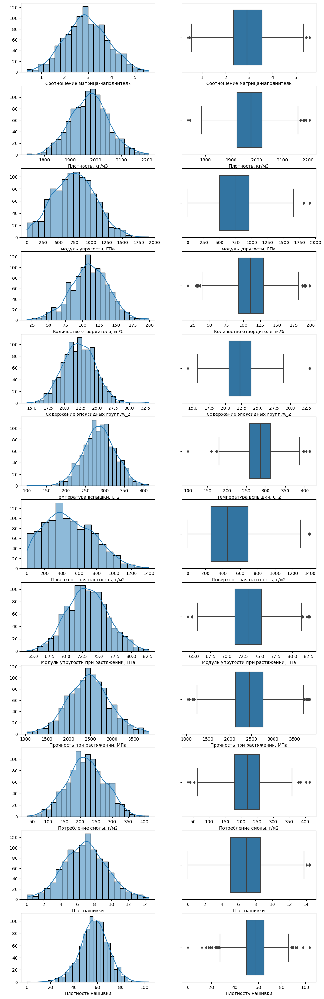

In [95]:
# графики распределения переменных и "ящики с усами"
fig, axes = plt.subplots(cols_numerical.shape[1], 2, figsize=(12, 40))
for el, column in enumerate(cols_numerical):
    axes[el, 0].set(ylabel=' ')
    sns.histplot(data=df, x=column, kde=True, ax=axes[el, 0], )
    sns.boxplot(data=df, x=column, ax=axes[el, 1])
plt.show()

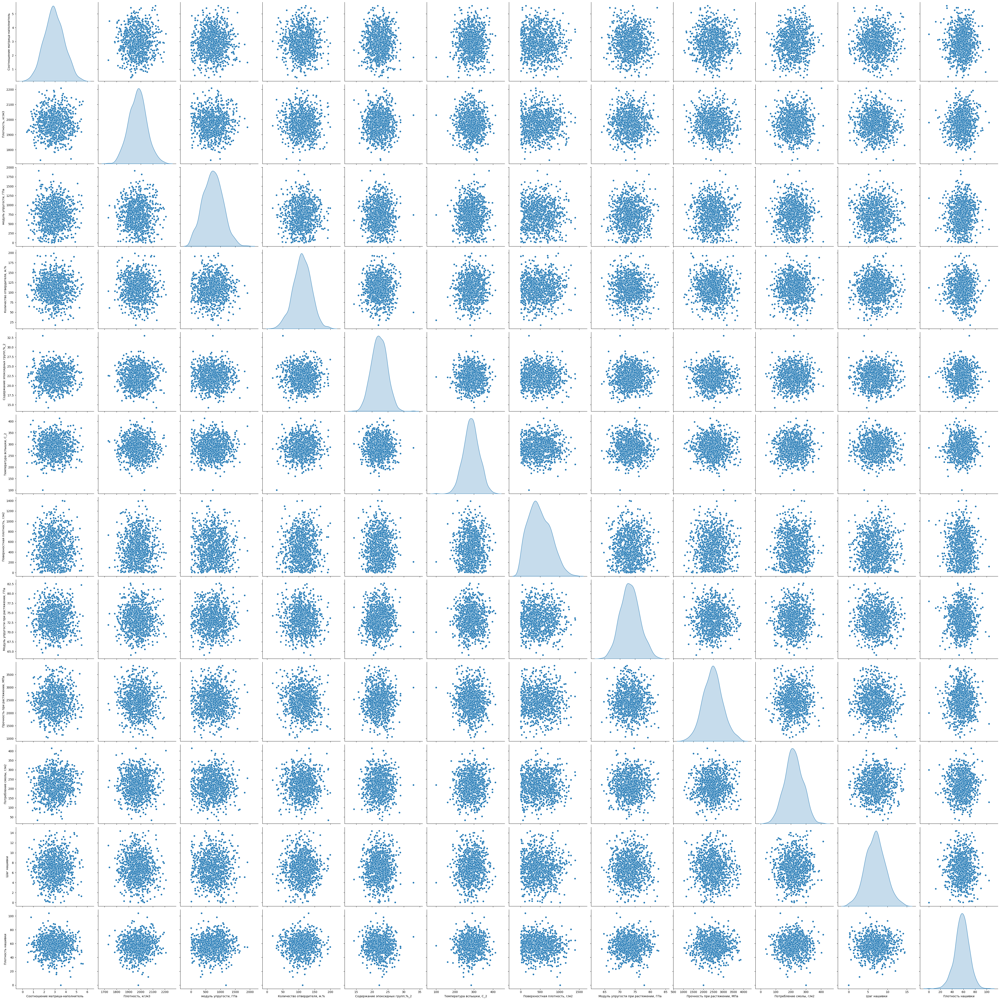

In [96]:
sns.pairplot(cols_numerical, height=4, diag_kind='kde')
plt.show()


In [97]:
# на графиках заметны выбросы
df.describe()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
count,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000,1023.000000
mean,2.930366,1975.734888,739.923233,110.570769,22.244390,285.882151,482.731833,73.328571,2466.922843,218.423144,44.252199,6.899222,57.153929
std,0.913222,73.729231,330.231581,28.295911,2.406301,40.943260,281.314690,3.118983,485.628006,59.735931,45.015793,2.563467,12.350969
min,0.389403,1731.764635,2.436909,17.740275,14.254985,100.000000,0.603740,64.054061,1036.856605,33.803026,0.000000,0.000000,0.000000
25%,2.317887,1924.155467,500.047452,92.443497,20.608034,259.066528,266.816645,71.245018,2135.850448,179.627520,0.000000,5.080033,49.799212
50%,2.906878,1977.621657,739.664328,110.564840,22.230744,285.896812,451.864365,73.268805,2459.524526,219.198882,0.000000,6.916144,57.341920
75%,3.552660,2021.374375,961.812526,129.730366,23.961934,313.002106,693.225017,75.356612,2767.193119,257.481724,90.000000,8.586293,64.944961
max,5.591742,2207.773481,1911.536477,198.953207,33.000000,413.273418,1399.542362,82.682051,3848.436732,414.590628,90.000000,14.440522,103.988901


In [98]:
cols_numerical.skew().sort_values(ascending=False)

Поверхностная плотность, г/м2           0.395466
Модуль упругости при растяжении, ГПа    0.127283
модуль упругости, ГПа                   0.120174
Шаг нашивки                             0.101997
Соотношение матрица-наполнитель         0.082271
Прочность при растяжении, МПа           0.078565
Плотность, кг/м3                        0.058629
Содержание эпоксидных групп,%_2         0.054258
Потребление смолы, г/м2                 0.006294
Температура вспышки, С_2               -0.056526
Количество отвердителя, м.%            -0.086197
Плотность нашивки                      -0.229535
dtype: float64

In [99]:
cols_numerical.kurt().sort_values(ascending=False)

Плотность нашивки                       0.860696
Температура вспышки, С_2                0.187924
Количество отвердителя, м.%             0.145763
Плотность, кг/м3                        0.063629
Содержание эпоксидных групп,%_2         0.042634
Прочность при растяжении, МПа           0.022146
Шаг нашивки                            -0.012810
Потребление смолы, г/м2                -0.124173
Модуль упругости при растяжении, ГПа   -0.161389
Соотношение матрица-наполнитель        -0.199334
модуль упругости, ГПа                  -0.206331
Поверхностная плотность, г/м2          -0.439103
dtype: float64

In [100]:
df.shape[0]

1023

In [101]:
Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3 - Q1
df = df[~((df < (Q1 - 1.5 * IQR) ) | (df > (Q3 + 1.5 * IQR)))]
# количество удаленных выбросов по строкам 
df.isna().sum()

Соотношение матрица-наполнитель          6
Плотность, кг/м3                         9
модуль упругости, ГПа                    2
Количество отвердителя, м.%             14
Содержание эпоксидных групп,%_2          2
Температура вспышки, С_2                 8
Поверхностная плотность, г/м2            2
Модуль упругости при растяжении, ГПа     6
Прочность при растяжении, МПа           11
Потребление смолы, г/м2                  8
Угол нашивки, град                       0
Шаг нашивки                              4
Плотность нашивки                       21
dtype: int64

In [102]:
# всего  удаленных выбросов 
df.isna().sum().sum()

93

In [103]:
df = df.dropna(axis=0).reset_index(drop=True)
df.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0,4.0,60.0
1,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0,5.0,47.0
2,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,57.0
3,2.767918,2000.0,748.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,60.0
4,2.569620,1910.0,807.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0,5.0,70.0


In [104]:
# осталось строк
df.shape[0]

936

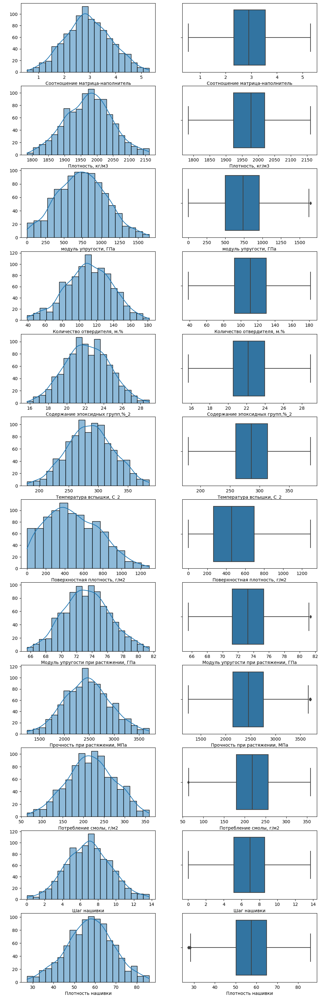

In [105]:
# графики распределения переменных и "ящики с усами" после удаления выбросов
fig, axes = plt.subplots(cols_numerical.shape[1], 2, figsize=(12, 40))
for el, column in enumerate(cols_numerical):
    axes[el, 0].set(ylabel=' ')
    sns.histplot(data=df, x=column, kde=True, ax=axes[el, 0])
    sns.boxplot(data=df, x=column, ax=axes[el, 1])
plt.show()

##  Распределения переменных после удаления выбросов 

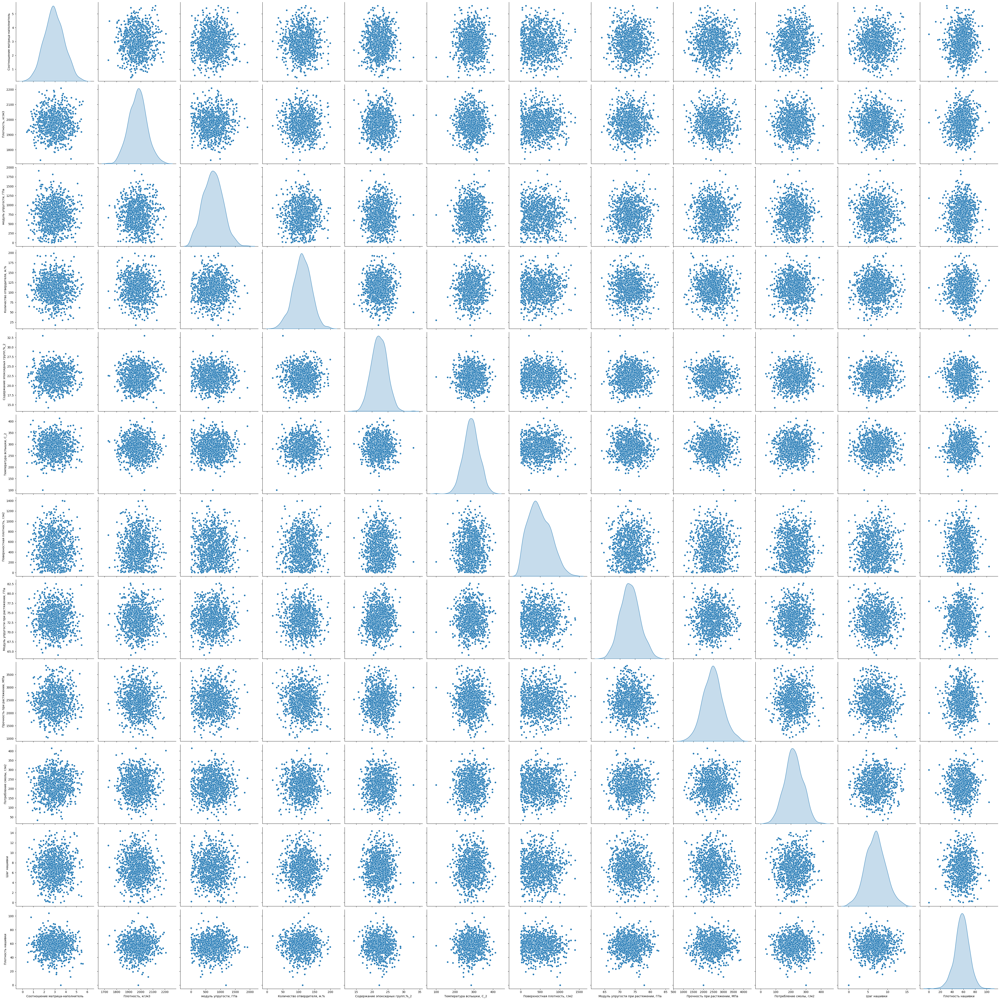

In [106]:
sns.pairplot(cols_numerical, height=4, diag_kind='kde')
plt.show()

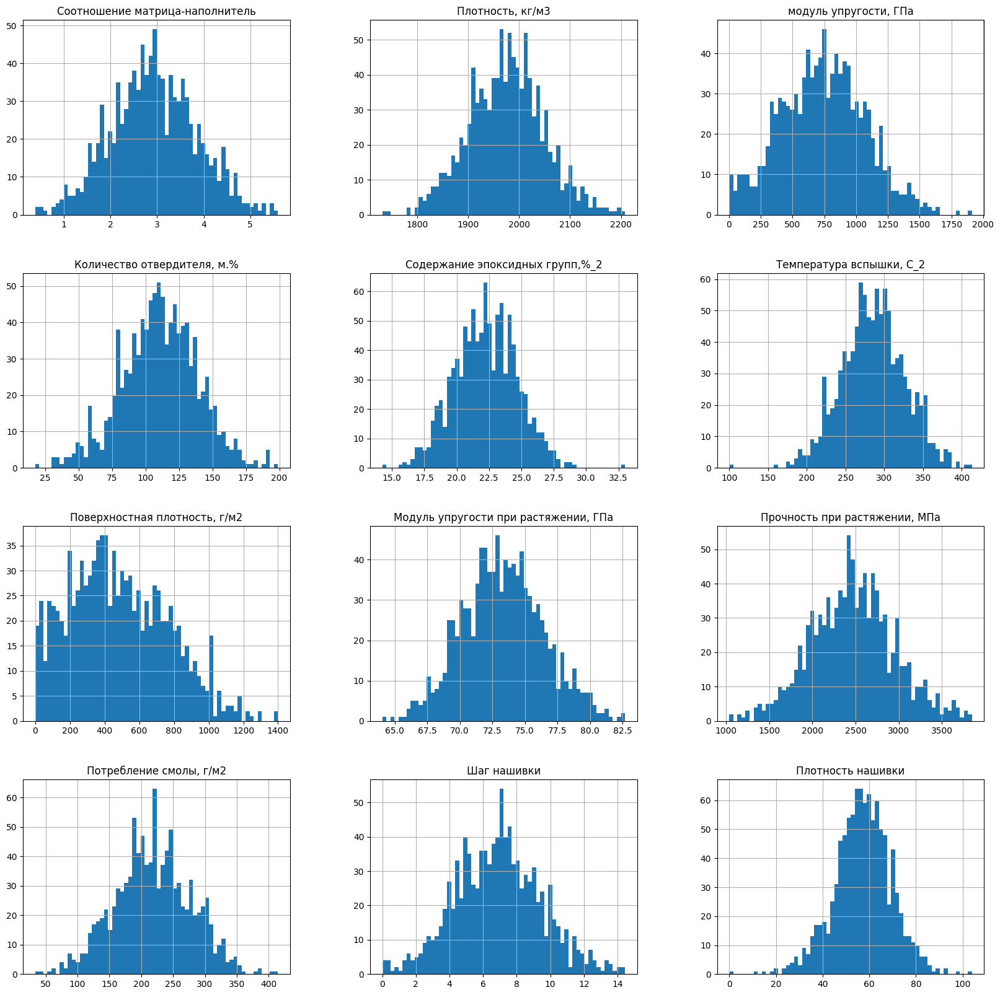

In [107]:
cols_numerical.hist(figsize=(20,20), bins=60)
plt.show()

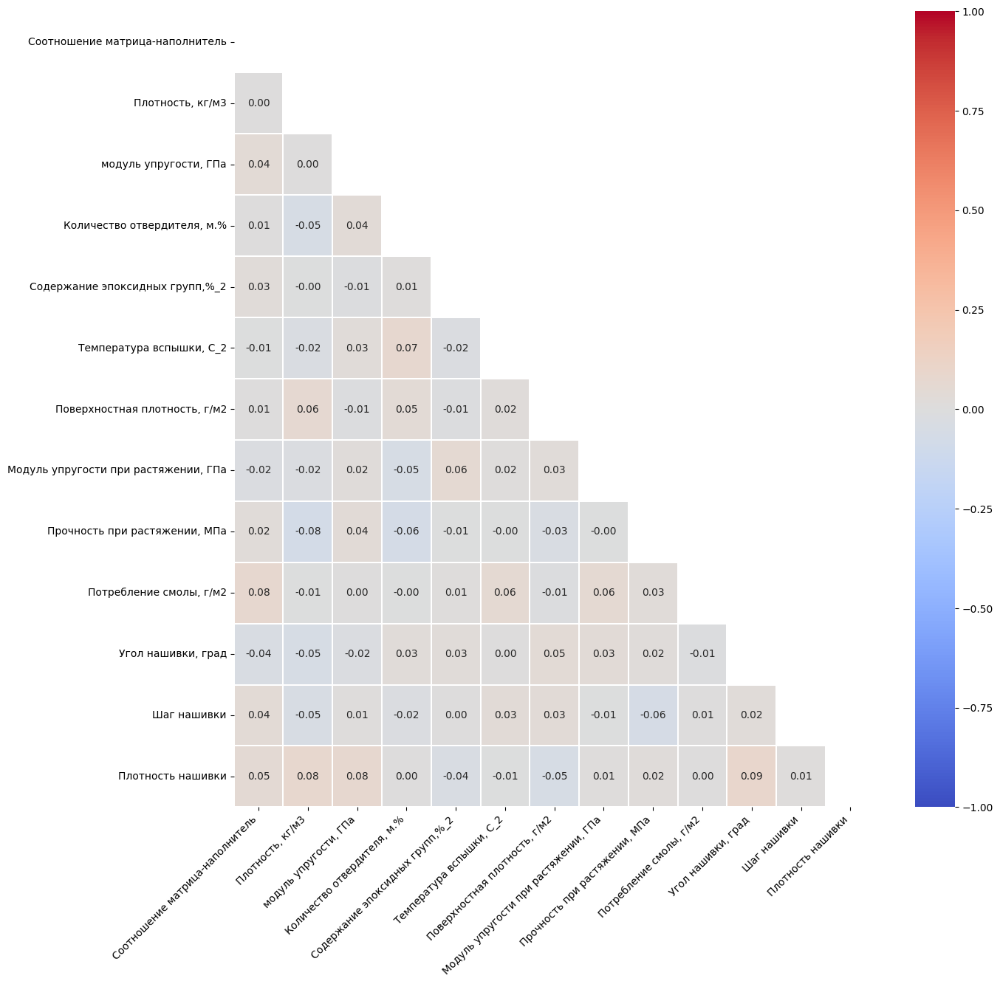

In [108]:
fig, ax = plt.subplots(figsize=(14,14))
mask = np.triu(df.corr())
sns.heatmap(df.corr(), mask=mask, cmap='coolwarm', annot=True, linewidths=0.1 , fmt='.2f', vmin=-1, vmax=1, center=0)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right')
plt.show()

#### корреляция очень слабая

In [109]:
df.shape

(936, 13)

In [110]:
# Данные очищенные от выбросов
df.to_excel('data/data_outliers_cleaned.xlsx')